In [3]:
# python native
import os
import json
import random
import datetime
from functools import partial

# external library
import cv2
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
from sklearn.model_selection import GroupKFold
import albumentations as A

# torch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models

# visualization
import matplotlib.pyplot as plt
from PIL import Image

/opt/conda/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.18). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


데이터셋 연결 확인

In [4]:
# 데이터 경로를 입력하세요

IMAGE_ROOT = "data/train/DCM"
LABEL_ROOT = "data/train/outputs_json"

CLASSES = [
    'finger-1', 'finger-2', 'finger-3', 'finger-4', 'finger-5',
    'finger-6', 'finger-7', 'finger-8', 'finger-9', 'finger-10',
    'finger-11', 'finger-12', 'finger-13', 'finger-14', 'finger-15',
    'finger-16', 'finger-17', 'finger-18', 'finger-19', 'Trapezium',
    'Trapezoid', 'Capitate', 'Hamate', 'Scaphoid', 'Lunate',
    'Triquetrum', 'Pisiform', 'Radius', 'Ulna',
]

CLASS2IND = {v: i for i, v in enumerate(CLASSES)}

IND2CLASS = {v: k for k, v in CLASS2IND.items()}

pngs = {
    os.path.relpath(os.path.join(root, fname), start=IMAGE_ROOT)
    for root, _dirs, files in os.walk(IMAGE_ROOT)
    for fname in files
    if os.path.splitext(fname)[1].lower() == ".png"
}

jsons = {
    os.path.relpath(os.path.join(root, fname), start=LABEL_ROOT)
    for root, _dirs, files in os.walk(LABEL_ROOT)
    for fname in files
    if os.path.splitext(fname)[1].lower() == ".json"
}

print(f'len(pngs): {len(pngs)}, len(jsons): {len(jsons)}')



len(pngs): 796, len(jsons): 796


모든 .png 파일에 대해 .json pair가 존재하는지 체크합니다. 파일명에서 확장자를 제거한 set을 생성하고 두 집합의 차집합의 크기가 0인지 확인합니다.

In [8]:
jsons_fn_prefix = {os.path.splitext(fname)[0] for fname in jsons}
pngs_fn_prefix = {os.path.splitext(fname)[0] for fname in pngs}

assert len(jsons_fn_prefix - pngs_fn_prefix) == 0
assert len(pngs_fn_prefix - jsons_fn_prefix) == 0

In [9]:
pngs = sorted(pngs)
jsons = sorted(jsons)

Define Dataset Class

In [10]:
class XRayDataset(Dataset):
    def __init__(self, transforms=None):
        # 전체 파일을 filenames와 labelnames에 넣습니다.
        self.filenames = pngs
        self.labelnames = jsons
        self.transforms = transforms
    
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, item):
        image_name = self.filenames[item]
        image_path = os.path.join(IMAGE_ROOT, image_name)
        
        image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
        image = image / 255.
        image = image[..., np.newaxis]
        print("Image shape:", image.shape)
        
        label_name = self.labelnames[item]
        label_path = os.path.join(LABEL_ROOT, label_name)
        
        # (H, W, NC) 모양의 label 생성
        label_shape = tuple(image.shape[:2]) + (len(CLASSES), )
        label = np.zeros(label_shape, dtype=np.uint8)
        
        # label 파일 읽기
        with open(label_path, "r") as f:
            annotations = json.load(f)
        annotations = annotations["annotations"]
        
        # 클래스 별로 처리
        for ann in annotations:
            c = ann["label"]
            class_ind = CLASS2IND[c]
            points = np.array(ann["points"])
            
            # polygon 포맷을 dense한 mask 포맷으로 바꾸기
            class_label = np.zeros(image.shape[:2], dtype=np.uint8)
            cv2.fillPoly(class_label, [points], 1)
            label[..., class_ind] = class_label
        
        if self.transforms is not None:
            inputs = {"image": image, "mask": label}
            result = self.transforms(**inputs)
            
            image = result["image"]
            label = result["mask"]

        # to tensor
        image = image.transpose(2, 0, 1)
        label = label.transpose(2, 0, 1)
        
        image = torch.from_numpy(image).float()
        label = torch.from_numpy(label).float()
            
        return image, label


In [11]:
# 시각화를 위한 팔레트를 설정합니다.
PALETTE = [
    (220, 20, 60), (119, 11, 32), (0, 0, 142), (0, 0, 230), (106, 0, 228),
    (0, 60, 100), (0, 80, 100), (0, 0, 70), (0, 0, 192), (250, 170, 30),
    (100, 170, 30), (220, 220, 0), (175, 116, 175), (250, 0, 30), (165, 42, 42),
    (255, 77, 255), (0, 226, 252), (182, 182, 255), (0, 82, 0), (120, 166, 157),
    (110, 76, 0), (174, 57, 255), (199, 100, 0), (72, 0, 118), (255, 179, 240),
    (0, 125, 92), (209, 0, 151), (188, 208, 182), (0, 220, 176),
]

# 시각화 함수입니다. 클래스가 2개 이상인 픽셀을 고려하지는 않습니다.
def label2rgb(label):
    image_size = label.shape[1:] + (3, )
    image = np.zeros(image_size, dtype=np.uint8)
    
    for i, class_label in enumerate(label):
        image[class_label == 1] = PALETTE[i]
        
    return image

In [12]:
dataset = XRayDataset()

In [13]:
image, label = dataset[0]
print(image.shape, label.shape)
len(dataset)

Image shape: (2048, 2048, 1)
torch.Size([1, 2048, 2048]) torch.Size([29, 2048, 2048])


796

채널이 3인데, 차이 확인

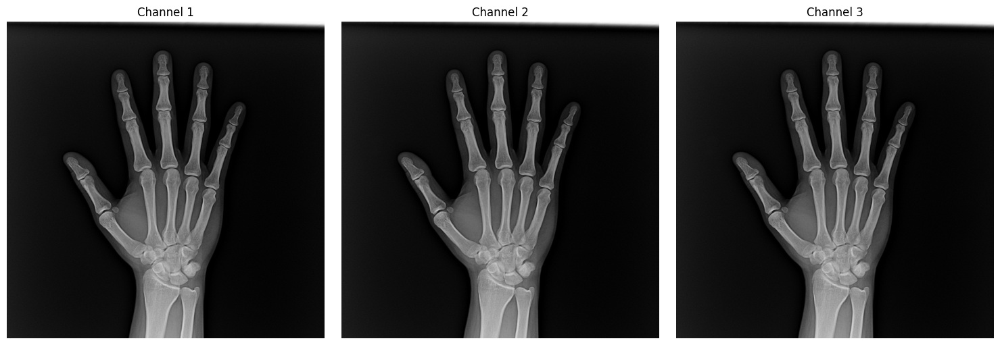

In [9]:
import matplotlib.pyplot as plt

# 첫 번째 샘플에서 image만 가져오기
image, label = dataset[622]

# 이미지 출력 (채널 3개를 모두 출력하려면 각 채널별로 시각화)
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

# 채널별로 이미지 출력 (예: RGB 채널)
for i in range(3):
    ax[i].imshow(image[i], cmap='gray')  # 각 채널을 grayscale로 출력
    ax[i].set_title(f"Channel {i+1}")
    ax[i].axis('off')  # 축을 숨김

plt.tight_layout()
plt.show()


3개의 이미지를 합쳐서 보기

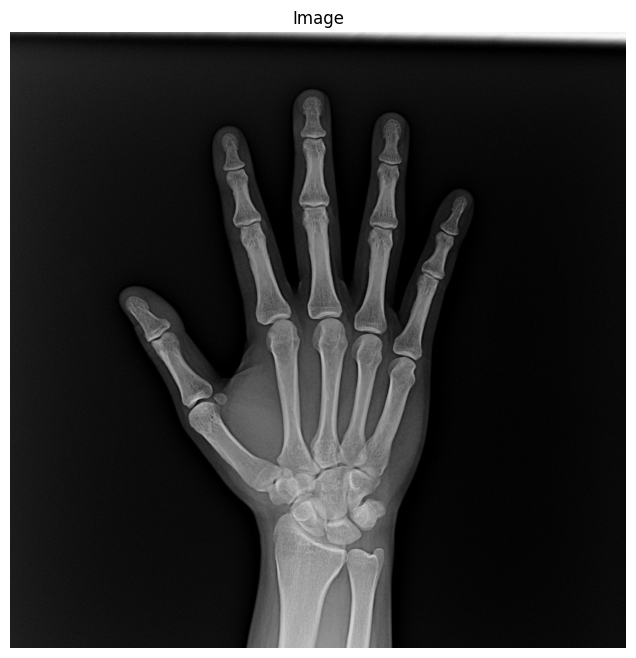

In [99]:
# (3, height, width)를 (height, width, 3)로 변환
image = image.permute(1, 2, 0).numpy()

# 이미지 출력
plt.figure(figsize=(8, 8))
plt.imshow(image)
plt.title("Image")
plt.axis('off')  # 축을 숨김
plt.show()


In [100]:
import numpy as np

# 각 채널의 고유 값 확인
unique_channel1 = np.unique(image[0])
unique_channel2 = np.unique(image[1])
unique_channel3 = np.unique(image[2])

print(f"Channel 1 unique values: {unique_channel1}")
print(f"Channel 2 unique values: {unique_channel2}")
print(f"Channel 3 unique values: {unique_channel3}")


Channel 1 unique values: [0.25490198 0.2627451  0.26666668 0.27058825 0.27450982 0.2784314
 0.28235295 0.28627452 0.2901961  0.29411766 0.29803923 0.3019608
 0.30588236 0.30980393 0.3137255  0.31764707 0.32156864 0.3254902
 0.32941177 0.33333334 0.3372549  0.34117648 0.34509805 0.34901962
 0.3529412  0.35686275 0.36078432 0.3647059  0.36862746 0.37254903
 0.3764706  0.38039216 0.38431373 0.3882353  0.39215687 0.39607844
 0.4        0.40392157 0.40784314 0.4117647  0.41568628 0.41960785
 0.42352942 0.42745098 0.43137255 0.43529412 0.4392157  0.44313726
 0.44705883 0.4509804  0.45490196 0.45882353 0.4627451  0.46666667
 0.47058824 0.4745098  0.47843137 0.48235294 0.4862745  0.49019608
 0.49411765 0.49803922 0.5019608  0.5058824  0.50980395 0.5137255
 0.5176471  0.52156866 0.5254902  0.5294118  0.53333336 0.5372549
 0.5411765  0.54509807 0.54901963 0.5529412  0.5568628  0.56078434
 0.5647059  0.5686275  0.57254905 0.5764706  0.5803922  0.58431375
 0.5882353  0.5921569  0.59607846 0.6     

           Channel1      Channel2      Channel3
count  4.194304e+06  4.194304e+06  4.194304e+06
mean   1.103314e-01  1.103314e-01  1.103314e-01
std    1.852224e-01  1.852224e-01  1.852224e-01
min    0.000000e+00  0.000000e+00  0.000000e+00
25%    1.568628e-02  1.568628e-02  1.568628e-02
50%    3.921569e-02  3.921569e-02  3.921569e-02
75%    6.274510e-02  6.274510e-02  6.274510e-02
max    1.000000e+00  1.000000e+00  1.000000e+00
Channel 1 unique count: 181
Channel 2 unique count: 189
Channel 3 unique count: 193
Correlation between (0, 1) channels: 0.9999999999999999
Correlation between (1, 2) channels: 0.9999999999999999
Correlation between (2, 0) channels: 0.9999999999999999
Sum of Correlation: 2.9999999999999996


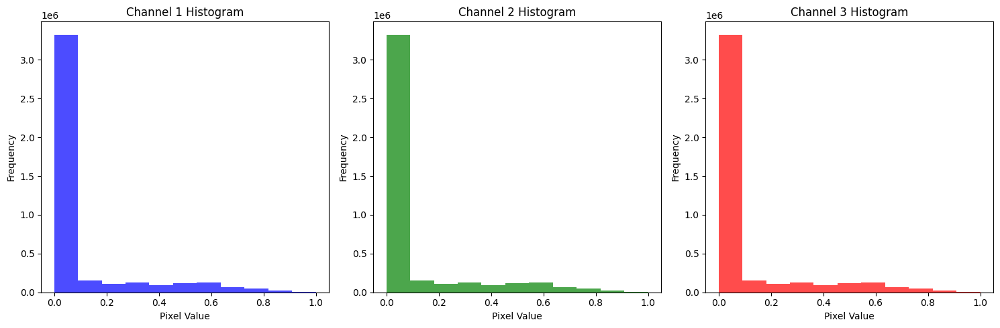

In [101]:
image, label = dataset[0]

# 이미지 채널이 numpy 배열인지 확인
if isinstance(image, np.ndarray):
    channel1 = image[0].flatten()
    channel2 = image[1].flatten()
    channel3 = image[2].flatten()
else:
    # 각 채널을 numpy 배열로 변환 후 describe() 사용
    channel1 = image[0].numpy().flatten()
    channel2 = image[1].numpy().flatten()
    channel3 = image[2].numpy().flatten()

# DataFrame에 각 채널을 넣고 describe() 사용
channels_df = pd.DataFrame({
    'Channel1': channel1,
    'Channel2': channel2,
    'Channel3': channel3
})

# describe() 사용해서 통계 요약 보기
channel_stats = channels_df.describe()

print(channel_stats)

# 각 채널의 픽셀 고유 값 개수 확인
print(f"Channel 1 unique count: {len(unique_channel1)}")
print(f"Channel 2 unique count: {len(unique_channel2)}")
print(f"Channel 3 unique count: {len(unique_channel3)}")

# 채널 간의 상관계수 계산
corr_01 = np.corrcoef(image[0].flatten(), image[1].flatten())[0, 1]  
corr_12 = np.corrcoef(image[1].flatten(), image[2].flatten())[0, 1]  
corr_20 = np.corrcoef(image[0].flatten(), image[2].flatten())[0, 1] 

print(f"Correlation between (0, 1) channels: {corr_01}")
print(f"Correlation between (1, 2) channels: {corr_12}")
print(f"Correlation between (2, 0) channels: {corr_20}")

print(f"Sum of Correlation: {corr_01 + corr_12 + corr_20}")


# 각 채널의 히스토그램을 출력
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

# 각 채널에 대해 다른 색상을 지정
colors = ['blue', 'green', 'red']

for i in range(3):
    ax[i].hist(image[i].flatten(), bins=11, color=colors[i], alpha=0.7)
    ax[i].set_title(f"Channel {i+1} Histogram")
    ax[i].set_xlabel('Pixel Value')
    ax[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


모든 이미지가 3개의 채널을 가지고 있는지 확인

In [ ]:
# # 3개의 채널을 가진 이미지가 있는지 확인
# for idx, (image, label) in enumerate(dataset):
#     # 이미지가 3채널을 가지고 있는지, 모두 같은 size를 가지고 있는지 확인
#     if image.shape == [3, 2048, 2048]:
#         print(f"Image {idx} has {image.shape}")
#     if idx % 100 == 0:
#         print(idx)

# # 시간이 15분 정도 걸립니다. 다 확인 했으니 실행할 필요는 없습니다.

0
100
200
300
400
500
600
700


Processed 0 images
Processed 20 images
Processed 40 images
Processed 60 images
Processed 80 images
Processed 100 images
Processed 120 images
Processed 140 images
Processed 160 images
Processed 180 images
Processed 200 images
Processed 220 images
Processed 240 images
Processed 260 images
Processed 280 images
Processed 300 images
Processed 320 images
Processed 340 images
Processed 360 images
Processed 380 images
Processed 400 images
Processed 420 images
Processed 440 images
Processed 460 images
Processed 480 images
Processed 500 images
Processed 520 images
Processed 540 images
Processed 560 images
Processed 580 images
Processed 600 images
Processed 620 images
Processed 640 images
Processed 660 images
Processed 680 images
Processed 700 images
Processed 720 images
Processed 740 images
Processed 760 images
Processed 780 images


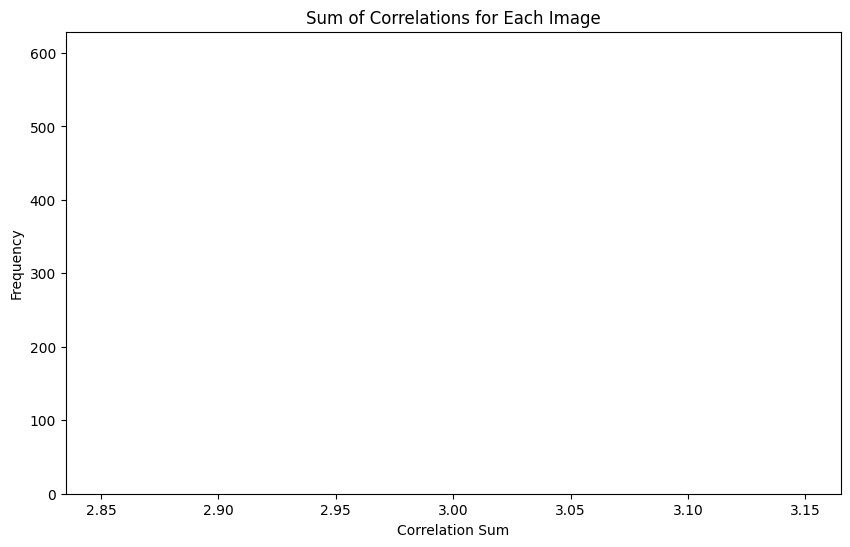

In [ ]:
# train_dataset의 모든 이미지에 대해 채널 간 상관계수 합을 계산
corr_sum_list = []

# 각 이미지의 크기를 확인하고, 문제를 파악 
for idx, (image, label) in enumerate(dataset):
    # 각 채널을 플래튼 후 상관계수 계산 및 NaN 처리
    img0_fla = image[0].ravel()
    img1_fla = image[1].ravel()
    img2_fla = image[2].ravel()

    corr_01 = np.nan_to_num(np.corrcoef(img0_fla, img1_fla)[0, 1])
    corr_12 = np.nan_to_num(np.corrcoef(img1_fla, img2_fla)[0, 1])
    corr_20 = np.nan_to_num(np.corrcoef(img0_fla, img2_fla)[0, 1])

    corr_sum = corr_01 + corr_12 + corr_20
    corr_sum_list.append(corr_sum)

    if idx % 20 == 0:
        print(f"Processed {idx} images")


In [ ]:
mean_corr = np.mean(corr_sum_list)
std_corr = np.std(corr_sum_list)
min_corr = np.min(corr_sum_list)
max_corr = np.max(corr_sum_list)

print("Mean:", mean_corr)
print("Std Deviation:", std_corr)
print("Min:", min_corr)


Mean: 3.0
Std Deviation: 3.8169719468841477e-16
Min: 2.999999999999999


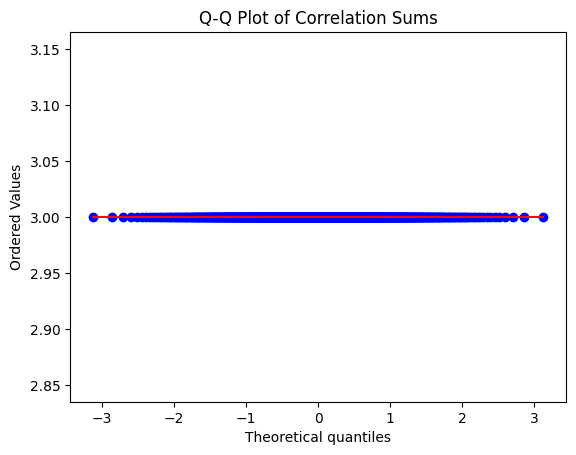

In [281]:
import scipy.stats as stats

stats.probplot(corr_sum_list, dist="norm", plot=plt)
plt.title("Q-Q Plot of Correlation Sums")
plt.show()


META data 분석

In [18]:
!pip install pandas openpyxl

  Obtaining dependency information for openpyxl from https://files.pythonhosted.org/packages/c0/da/977ded879c29cbd04de313843e76868e6e13408a94ed6b987245dc7c8506/openpyxl-3.1.5-py2.py3-none-any.whl.metadata
  Obtaining dependency information for et-xmlfile from https://files.pythonhosted.org/packages/c1/8b/5fe2cc11fee489817272089c4203e679c63b570a5aaeb18d852ae3cbba6a/et_xmlfile-2.0.0-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.9/250.9 kB 552.9 kB/s eta 0:00:00a 0:00:01


In [10]:
import pandas as pd

# 파일 경로 지정
file_path = '/data/ephemeral/home/eunseop/data/meta_data.xlsx'

# Excel 파일 읽기
df = pd.read_excel(file_path)

# 성별 열에서 "_x0008_" 부분 제거하기
df['성별'] = df['성별'].str.replace('_x0008_', '', regex=False)

# 결과 확인
print(df.head())


   ID  나이 성별  체중(몸무게)  키(신장) Unnamed: 5
0   1  30  여     63.0  165.0        NaN
1   2  21  남     70.0  172.0        NaN
2   3  21  여     48.0  164.0        NaN
3   4  30  여     49.0  158.0        NaN
4   5  33  여     50.0  160.0        NaN


In [11]:
# Unnamed: 5 열에서 NaN이 아닌 값과 해당 ID 필터링
non_nan_values_with_id = df[df['Unnamed: 5'].notna()][['ID', 'Unnamed: 5']]

# 결과 확인
print(non_nan_values_with_id)
# ID 73은 train 데이터셋에 있음.

    ID Unnamed: 5
72  73       네일있음


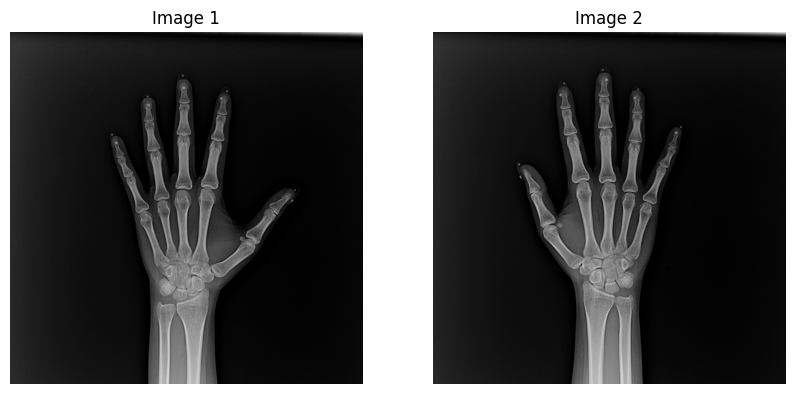

In [12]:
# 이미지 폴더 경로
nail_image_folder = "/data/ephemeral/home/eunseop/data/train/DCM/ID073"

# 폴더 안의 png 파일 목록 불러오기
image_files = [f for f in os.listdir(nail_image_folder) if f.endswith('.png')]

# 이미지 시각화
plt.figure(figsize=(10, 5))

for i, image_file in enumerate(image_files[:2]):  # 최대 2개의 이미지를 로드
    image_path = os.path.join(nail_image_folder, image_file)
    img = Image.open(image_path).convert('L')  # 이미지를 그레이스케일로 변환
    
    plt.subplot(1, 2, i + 1)  # 1행 2열의 서브플롯
    plt.imshow(img, cmap='gray')  # 'gray' 컬러 맵을 사용하여 그레이스케일로 시각화
    plt.axis('off')
    plt.title(f"Image {i + 1}")

plt.show()


In [13]:
# 'Unnamed: 5' 열 삭제
df = df.drop(columns=['Unnamed: 5'])

# 결과 확인
print(df)

      ID  나이 성별  체중(몸무게)  키(신장)
0      1  30  여     63.0  165.0
1      2  21  남     70.0  172.0
2      3  21  여     48.0  164.0
3      4  30  여     49.0  158.0
4      5  33  여     50.0  160.0
..   ...  .. ..      ...    ...
545  546  28  여     50.0  158.0
546  547  40  남     84.0  175.0
547  548  28  여     51.0  165.0
548  549  28  남     78.0  175.0
549  550  26  남     72.0  164.0

[550 rows x 5 columns]


In [14]:
# 경로 설정
train_folder = "/data/ephemeral/home/eunseop/data/train/DCM"
test_folder = "/data/ephemeral/home/eunseop/data/test/DCM"

# 폴더 안의 ID 목록 가져오기
train_ids = [f for f in os.listdir(train_folder) if os.path.isdir(os.path.join(train_folder, f))]
test_ids = [f for f in os.listdir(test_folder) if os.path.isdir(os.path.join(test_folder, f))]

# ID에서 'ID'를 제거하고, 남은 부분을 숫자로 변환
train_ids = [int(id[2:]) for id in train_ids]  # 'ID' 제거하고 숫자로 변환
test_ids = [int(id[2:]) for id in test_ids]    # 'ID' 제거하고 숫자로 변환

# train_df와 test_df 생성
train_df = df[df['ID'].isin(train_ids)]
test_df = df[df['ID'].isin(test_ids)]

# 결과 확인
print("Train DataFrame:")
print(train_df)
print("Test DataFrame:")
print(test_df)


Train DataFrame:
      ID  나이 성별  체중(몸무게)  키(신장)
0      1  30  여     63.0  165.0
1      2  21  남     70.0  172.0
2      3  21  여     48.0  164.0
3      4  30  여     49.0  158.0
4      5  33  여     50.0  160.0
..   ...  .. ..      ...    ...
543  544  25  여     56.0  163.0
544  545  24  여     60.0  156.0
545  546  28  여     50.0  158.0
546  547  40  남     84.0  175.0
547  548  28  여     51.0  165.0

[400 rows x 5 columns]
Test DataFrame:
      ID  나이 성별  체중(몸무게)  키(신장)
39    40  38  남     65.0  173.0
40    41  47  여     51.0  156.0
41    42  34  여     55.0  163.0
42    43  35  남     79.0  186.0
43    44  38  여     79.0  178.0
..   ...  .. ..      ...    ...
270  271  22  남     72.0  178.0
271  272  21  남     72.0  181.0
272  273  20  여     54.0  169.0
548  549  28  남     78.0  175.0
549  550  26  남     72.0  164.0

[144 rows x 5 columns]


Train DataFrame - Age Statistics:
count    400.000000
mean      32.380000
std       11.035627
min       19.000000
25%       25.000000
50%       29.000000
75%       36.000000
max       69.000000
Name: 나이, dtype: float64

Test DataFrame - Age Statistics:
count    144.000000
mean      30.722222
std        8.335990
min       19.000000
25%       25.000000
50%       28.000000
75%       35.000000
max       58.000000
Name: 나이, dtype: float64


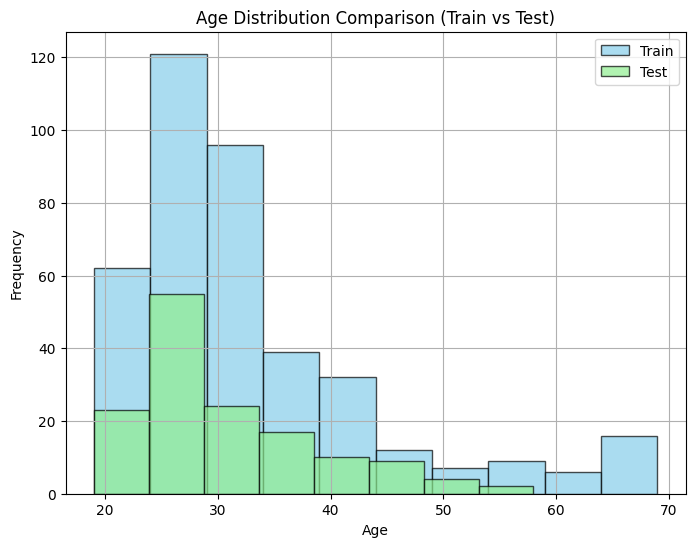

In [15]:
# train_df와 test_df의 나이에 대한 기초 통계량 출력
train_age_stats = train_df['나이'].describe()
test_age_stats = test_df['나이'].describe()

print("Train DataFrame - Age Statistics:")
print(train_age_stats)
print("\nTest DataFrame - Age Statistics:")
print(test_age_stats)

# train_df와 test_df의 나이 분포 시각화
plt.figure(figsize=(8, 6))

# train_df의 나이 분포
plt.hist(train_df['나이'], bins=10, color='skyblue', edgecolor='black', alpha=0.7, label='Train')

# test_df의 나이 분포
plt.hist(test_df['나이'], bins=8, color='lightgreen', edgecolor='black', alpha=0.7, label='Test')

plt.title('Age Distribution Comparison (Train vs Test)')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


Train DataFrame - Gender Distribution:
성별
여    218
남    182
Name: count, dtype: int64

Test DataFrame - Gender Distribution:
성별
남    76
여    68
Name: count, dtype: int64


/tmp/ipykernel_746331/3732977540.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['성별'] = train_df['성별'].str.strip()
/tmp/ipykernel_746331/3732977540.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['성별'] = test_df['성별'].str.strip()


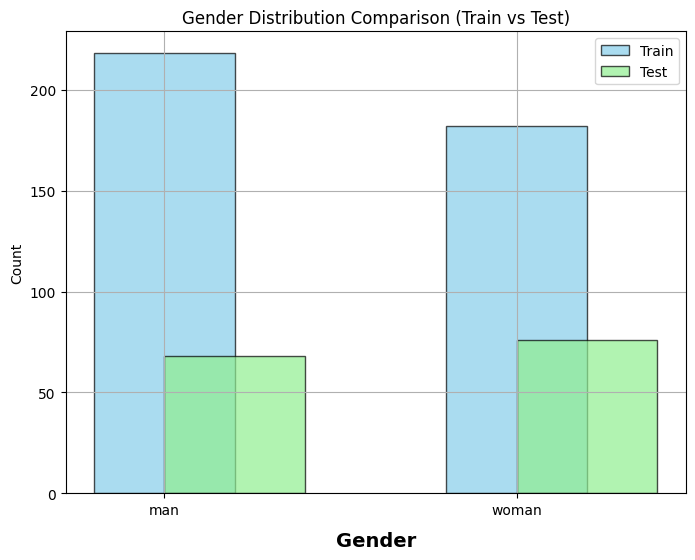

In [16]:
# 성별 열에서 공백 제거
train_df['성별'] = train_df['성별'].str.strip()
test_df['성별'] = test_df['성별'].str.strip()

# 성별 분포 계산
train_gender_count = train_df['성별'].value_counts()
test_gender_count = test_df['성별'].value_counts()

print("Train DataFrame - Gender Distribution:")
print(train_gender_count)

print("\nTest DataFrame - Gender Distribution:")
print(test_gender_count)

# 성별 비율 시각화
plt.figure(figsize=(8, 6))

# Train 데이터의 성별 분포
plt.bar(train_gender_count.index, train_gender_count.values, color='skyblue', edgecolor='black', alpha=0.7, label='Train', width=0.4, align='center')

# Test 데이터의 성별 분포
plt.bar(test_gender_count.index, test_gender_count.values, color='lightgreen', edgecolor='black', alpha=0.7, label='Test', width=0.4, align='edge')

# x축 레이블을 '남'과 '여'에서 'man'과 'woman'으로 변경
plt.xticks(ticks=[0, 1], labels=['man', 'woman'])

plt.title('Gender Distribution Comparison (Train vs Test)')
plt.xlabel('Gender', fontsize=14, fontweight='bold', labelpad=10)  # 여백과 글꼴 조정
plt.ylabel('Count')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()



성별에 따른 손의 이미지 크기 차이

In [25]:
image, label = dataset[0]


def count_visualized_pixels(label):
    total_visualized_pixels = 0  # 시각화된 픽셀의 총 수

    for i, class_label in enumerate(label):
        # torch.Tensor이면 torch.sum, numpy이면 np.sum 사용
        if isinstance(class_label, torch.Tensor):
            class_pixels = torch.sum(class_label == 1).item()  # torch.Tensor에서 1인 픽셀 수
        else:
            class_pixels = np.sum(class_label == 1)  # numpy 배열에서 1인 픽셀 수

        total_visualized_pixels += class_pixels

    total_visualized_pixels = total_visualized_pixels/(2048**2)

    return round(total_visualized_pixels, 3)


print(count_visualized_pixels(label))


0.109


In [30]:
import matplotlib.pyplot as plt

# 성별에 따라 손 크기 계산
def get_hand_size_distribution(df, dataset):
    male_hand_size = []
    female_hand_size = []

    for i in range(len(df)):
        gender = df.iloc[i]['성별']
        image, label = dataset[i]  # 데이터셋에서 이미지와 레이블 가져오기
        
        hand_size = count_visualized_pixels(label)  # 손 크기 계산

        if gender == '남':
            male_hand_size.append(hand_size)
        elif gender == '여':
            female_hand_size.append(hand_size)
    
    return male_hand_size, female_hand_size




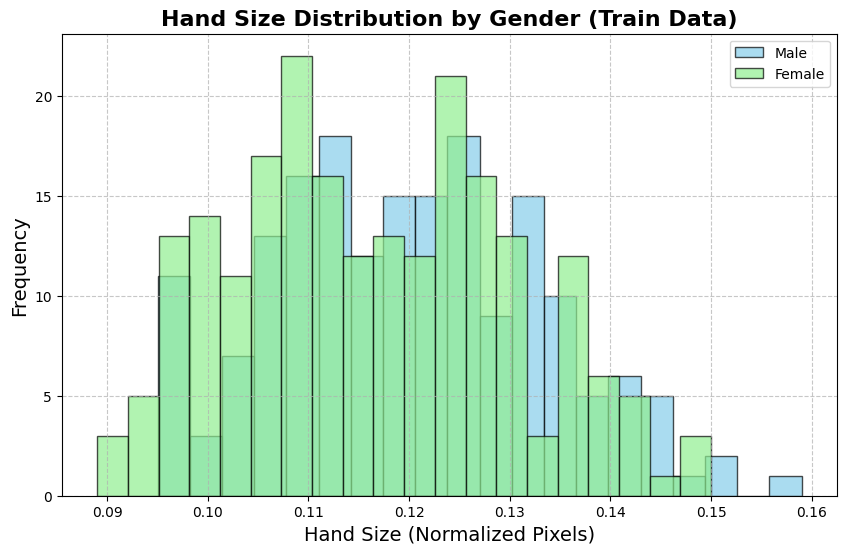

In [32]:
# 남자와 여자별 손 크기 분포 계산
male_hand_size, female_hand_size = get_hand_size_distribution(train_df, dataset)

# 시각화
plt.figure(figsize=(10, 6))

# 남자의 손 크기 분포
plt.hist(male_hand_size, bins=20, color='skyblue', alpha=0.7, label='Male', edgecolor='black')

# 여자의 손 크기 분포
plt.hist(female_hand_size, bins=20, color='lightgreen', alpha=0.7, label='Female', edgecolor='black')

# 제목과 레이블 설정
plt.title('Hand Size Distribution by Gender (Train Data)', fontsize=16, fontweight='bold')
plt.xlabel('Hand Size (Normalized Pixels)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# 범례 추가
plt.legend(loc='upper right')

# 그리드 추가
plt.grid(True, linestyle='--', alpha=0.7)

# 시각화
plt.show()

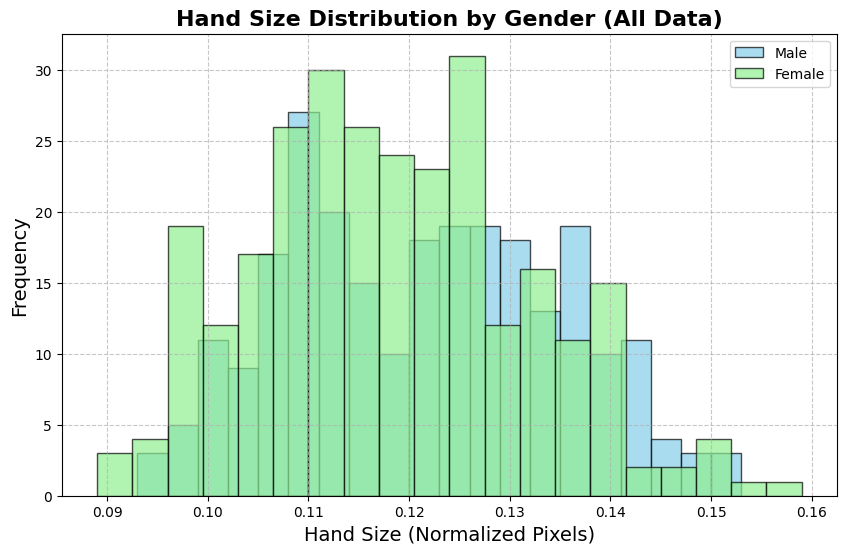

In [33]:
# 남자와 여자별 손 크기 분포 계산
male_hand_size, female_hand_size = get_hand_size_distribution(df, dataset)


# 시각화
plt.figure(figsize=(10, 6))

# 남자의 손 크기 분포
plt.hist(male_hand_size, bins=20, color='skyblue', alpha=0.7, label='Male', edgecolor='black')

# 여자의 손 크기 분포
plt.hist(female_hand_size, bins=20, color='lightgreen', alpha=0.7, label='Female', edgecolor='black')

# 제목과 레이블 설정
plt.title('Hand Size Distribution by Gender (All Data)', fontsize=16, fontweight='bold')
plt.xlabel('Hand Size (Normalized Pixels)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# 범례 추가
plt.legend(loc='upper right')

# 그리드 추가
plt.grid(True, linestyle='--', alpha=0.7)

# 시각화
plt.show()

손가락, 손등, 팔 히트맵

In [5]:
CLASSES_grouped = [
    ['finger-1', 'finger-2', 'finger-3', 'finger-4', 'finger-5',
    'finger-6', 'finger-7', 'finger-8', 'finger-9', 'finger-10',
    'finger-11', 'finger-12', 'finger-13', 'finger-14', 'finger-15',
    'finger-16', 'finger-17', 'finger-18', 'finger-19'],
    ['Trapezium', 'Trapezoid', 'Capitate', 'Hamate', 'Scaphoid', 'Lunate',
    'Triquetrum', 'Pisiform'], 
    ['Radius', 'Ulna']
]

all_points_right = {cls: [] for cls in CLASSES}
all_points_left = {cls: [] for cls in CLASSES}

jsons = {
    os.path.relpath(os.path.join(root, fname), start=LABEL_ROOT)
    for root, _dirs, files in os.walk(LABEL_ROOT)
    for fname in files
    if os.path.splitext(fname)[1].lower() == ".json"
}
jsons = sorted(jsons)
_labelnames = np.array(jsons)

In [6]:
for idx, label_name in enumerate(_labelnames):
    label_path = os.path.join(LABEL_ROOT, label_name)

    with open(label_path, "r") as f:
        ann = json.load(f)
    ann = ann["annotations"]

    if idx % 2 == 0:
        for cls in CLASSES:
            all_points_right[cls].extend([np.array(ann[i]['points']) for i in range(29) if ann[i]['label'] == cls])
    else:
        for cls in CLASSES:
            all_points_left[cls].extend([np.array(ann[i]['points']) for i in range(29) if ann[i]['label'] == cls])

for hand, all_points in zip(['Right', 'Left'], [all_points_right, all_points_left]):
    for group_idx, group_classes in enumerate(CLASSES_grouped):
        all_points_group = []
        for cls in group_classes:
            if cls in all_points:
                all_points_group.extend(all_points[cls])
        if all_points_group:
            all_points_group = np.concatenate(all_points_group)
            plt.figure(figsize=(2048/100, 2048/100))
            x_cls = all_points_group[:, 0]
            y_cls = all_points_group[:, 1]
            plt.hexbin(x_cls, y_cls, gridsize=100, cmap='inferno', alpha=0.6, mincnt=1)
            plt.colorbar(label='Frequency')
            plt.title(f'{hand} Hand - Group {group_idx+1}')
            plt.xlim(0, 2048)
            plt.ylim(0, 2048)
            plt.gca().invert_yaxis()  # y축 반전
            plt.tight_layout()
            plt.savefig(f'{hand.lower()}_hand_group_{group_idx+1}.png')
            plt.close()

In [7]:
import numpy as np

# 결과를 저장할 딕셔너리
bounding_boxes = {'Right': {}, 'Left': {}}

# 모든 그룹별 x_min, y_min, x_max, y_max 계산
for hand, all_points in zip(['Right', 'Left'], [all_points_right, all_points_left]):
    for group_idx, group_classes in enumerate(CLASSES_grouped):
        all_points_group = []
        for cls in group_classes:
            if cls in all_points:
                all_points_group.extend(all_points[cls])
        if all_points_group:
            all_points_group = np.concatenate(all_points_group)
            x_coords = all_points_group[:, 0]
            y_coords = all_points_group[:, 1]
            
            # x_min, y_min, x_max, y_max 계산
            x_min, y_min = x_coords.min(), y_coords.min()
            x_max, y_max = x_coords.max(), y_coords.max()
            
            # 저장
            bounding_boxes[hand][f'Group {group_idx+1}'] = {
                'x_min': x_min,
                'y_min': y_min,
                'x_max': x_max,
                'y_max': y_max
            }

# 결과 출력
for hand in bounding_boxes:
    print(f"{hand} Hand Bounding Boxes:")
    for group, bbox in bounding_boxes[hand].items():
        print(f"  {group}: {bbox}")


Right Hand Bounding Boxes:
  Group 1: {'x_min': 229, 'y_min': 20, 'x_max': 2027, 'y_max': 1749}
  Group 2: {'x_min': 683, 'y_min': 1032, 'x_max': 1347, 'y_max': 1882}
  Group 3: {'x_min': 645, 'y_min': 1254, 'x_max': 1311, 'y_max': 2047}
Left Hand Bounding Boxes:
  Group 1: {'x_min': 25, 'y_min': 23, 'x_max': 1812, 'y_max': 1699}
  Group 2: {'x_min': 702, 'y_min': 1066, 'x_max': 1335, 'y_max': 1852}
  Group 3: {'x_min': 717, 'y_min': 1282, 'x_max': 1349, 'y_max': 2047}


In [ ]:
{'x_min': 701, 'y_min': 166, 'x_max': 1365, 'y_max': 1016}
{'x_min': 713, 'y_min': 196, 'x_max': 1346, 'y_max': 982}

{'x_min': 683, 'y_min': 1032, 'x_max': 1347, 'y_max': 1882}

{'x_min': 701, 'y_min': 166, 'x_max': 1365, 'y_max': 1016}

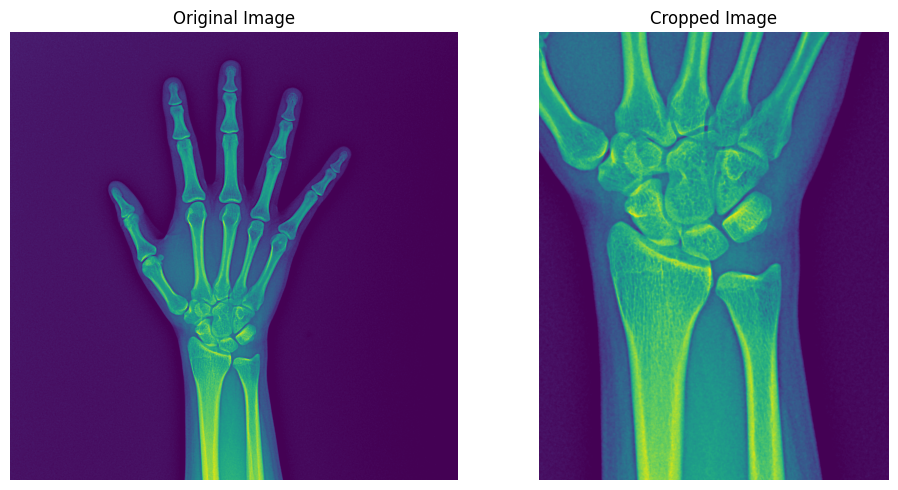

In [16]:
import matplotlib.pyplot as plt

# 좌표 설정
crop_coords = {'x_min': 683, 'y_min': 1032, 'x_max': 1347, 'y_max': 1882}
image = np.squeeze(image)
# 좌표에 따라 Crop
x_min, y_min, x_max, y_max = crop_coords['x_min'], crop_coords['y_min'], crop_coords['x_max'], crop_coords['y_max']
cropped_image = image[y_min:y_max, x_min:x_max]  # 이미지 Crop


# 원본 이미지와 Crop된 이미지 시각화
plt.figure(figsize=(10, 5))

# 원본 이미지
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image)
plt.axis("off")

# Crop된 이미지
plt.subplot(1, 2, 2)
plt.title("Cropped Image")
plt.imshow(cropped_image)
plt.axis("off")

plt.tight_layout()
plt.show()


Image shape: (2048, 2048, 1)


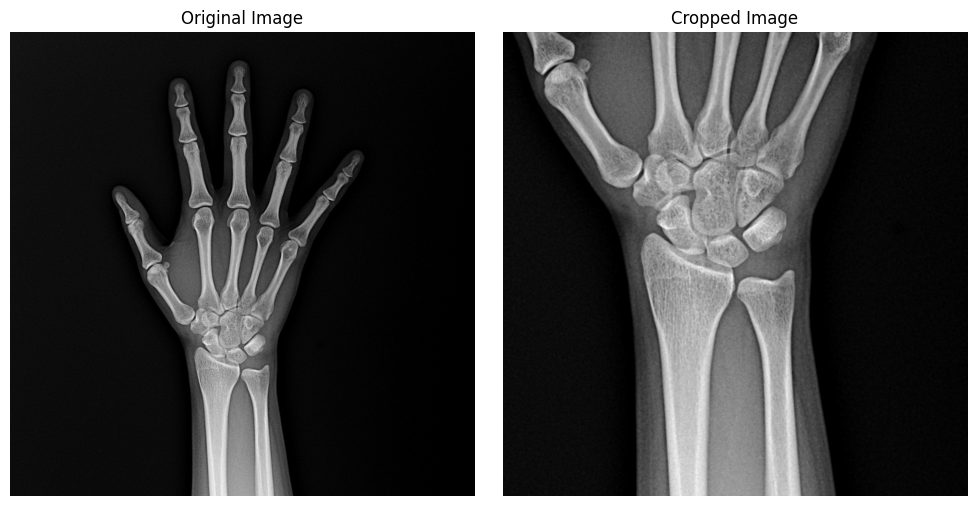

In [21]:
import albumentations as A
from albumentations.augmentations.crops.transforms import Crop
import matplotlib.pyplot as plt
import numpy as np

image, label = dataset[0]

# 좌표 설정 x:1015+-500 y: 1457+-500
crop_coords = {'x_min': 683, 'y_min': 1032, 'x_max': 1347, 'y_max': 1882}
crop_coords = {'x_min': 515, 'y_min': 957, 'x_max': 1515, 'y_max': 1957}

x_min, y_min, x_max, y_max = crop_coords['x_min'], crop_coords['y_min'], crop_coords['x_max'], crop_coords['y_max']

# Albumentations Crop transform 생성
crop_transform = Crop(x_min=x_min, y_min=y_min, x_max=x_max, y_max=y_max)

image = image.permute(1, 2, 0)

# Albumentations 적용
augmented = crop_transform(image=image)
cropped_image = augmented['image']

# 원본 이미지와 Crop된 이미지 시각화
plt.figure(figsize=(10, 5))

# 원본 이미지
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image, cmap='gray')  # 원래 그레이스케일 이미지
plt.axis("off")

# Crop된 이미지
plt.subplot(1, 2, 2)
plt.title("Cropped Image")
plt.imshow(cropped_image, cmap='gray')  # Crop 후 그레이스케일
plt.axis("off")

plt.tight_layout()
plt.show()


하얀색 부분 있는 이미지가 얼마나 많은지 확인

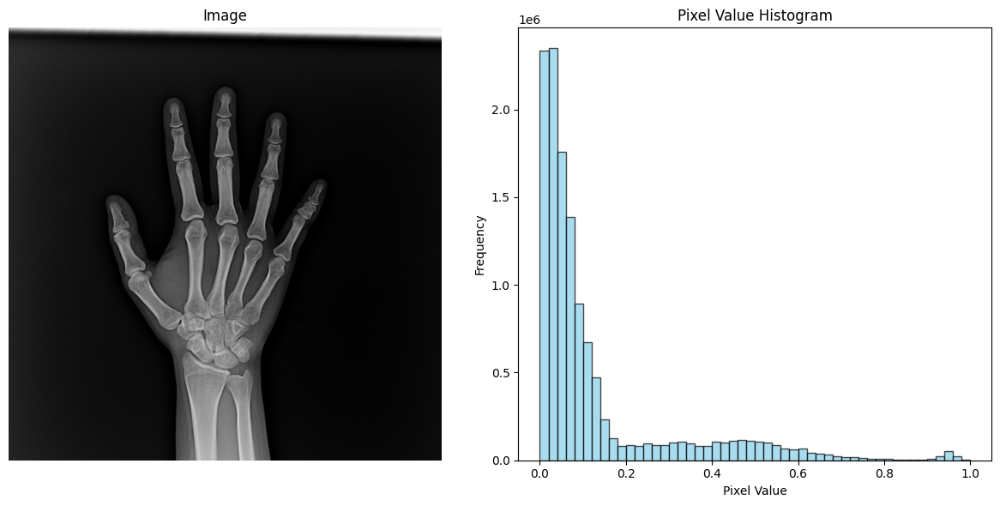

In [150]:
# 이미지와 레이블 불러오기
image, label = dataset[18]

# 이미지 시각화 (RGB 이미지)
plt.figure(figsize=(12, 6))

# image[image = 0.7] = 0  # 픽셀 값이 0.95 이상인 값을 0으로 설정

# 이미지 출력 (채널 순서를 맞추기 위해 permute 사용)
plt.subplot(1, 2, 1)
plt.imshow(image.permute(1, 2, 0))  # (3, 2048, 2048) -> (2048, 2048, 3) 형태로 변환
plt.title('Image')
plt.axis('off')

# 히스토그램 출력
plt.subplot(1, 2, 2)
plt.hist(image.flatten(), bins=50, color='skyblue', edgecolor='black', alpha=0.7)
plt.title('Pixel Value Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

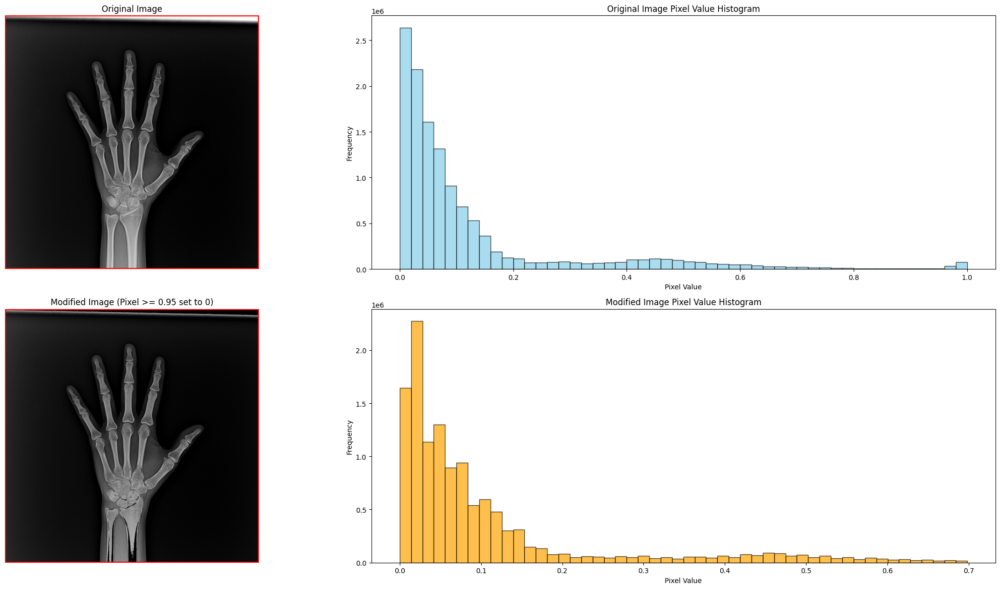

In [138]:
import matplotlib.patches as patches

# 이미지와 레이블 불러오기
image, label = dataset[11]

# 원본 이미지를 저장하여 나중에 비교할 수 있도록 함
original_image = image.clone()

# 이미지 수정: 픽셀 값 중 0.95 이상인 값들을 0으로 설정
image[image >= 0.7] = 0  # 픽셀 값이 0.95 이상인 값을 0으로 설정

# 이미지 시각화 (RGB 이미지)
plt.figure(figsize=(24, 12))  # 더 넓은 화면으로 크기를 조정

# 원본 이미지 출력 (채널 순서를 맞추기 위해 permute 사용)
ax = plt.subplot(2, 2, 1)
rect = patches.Rectangle((0, 0), image.shape[2], image.shape[1], linewidth=3, edgecolor='red', facecolor='none')
ax.add_patch(rect)
plt.imshow(original_image.permute(1, 2, 0))  # (3, 2048, 2048) -> (2048, 2048, 3) 형태로 변환
plt.title('Original Image')
plt.axis('off')

# 수정된 이미지 출력 (채널 순서를 맞추기 위해 permute 사용)
ax = plt.subplot(2, 2, 3)
rect = patches.Rectangle((0, 0), image.shape[2], image.shape[1], linewidth=3, edgecolor='red', facecolor='none')
ax.add_patch(rect)
plt.imshow(image.permute(1, 2, 0))  # (3, 2048, 2048) -> (2048, 2048, 3) 형태로 변환
plt.title('Modified Image (Pixel >= 0.95 set to 0)')
plt.axis('off')

# 원본 이미지 히스토그램 출력
ax = plt.subplot(2, 2, 2)
plt.hist(original_image.flatten(), bins=50, color='skyblue', edgecolor='black', alpha=0.7)
plt.title('Original Image Pixel Value Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

# 수정된 이미지 히스토그램 출력
ax = plt.subplot(2, 2, 4)
plt.hist(image.flatten(), bins=50, color='orange', edgecolor='black', alpha=0.7)
plt.title('Modified Image Pixel Value Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


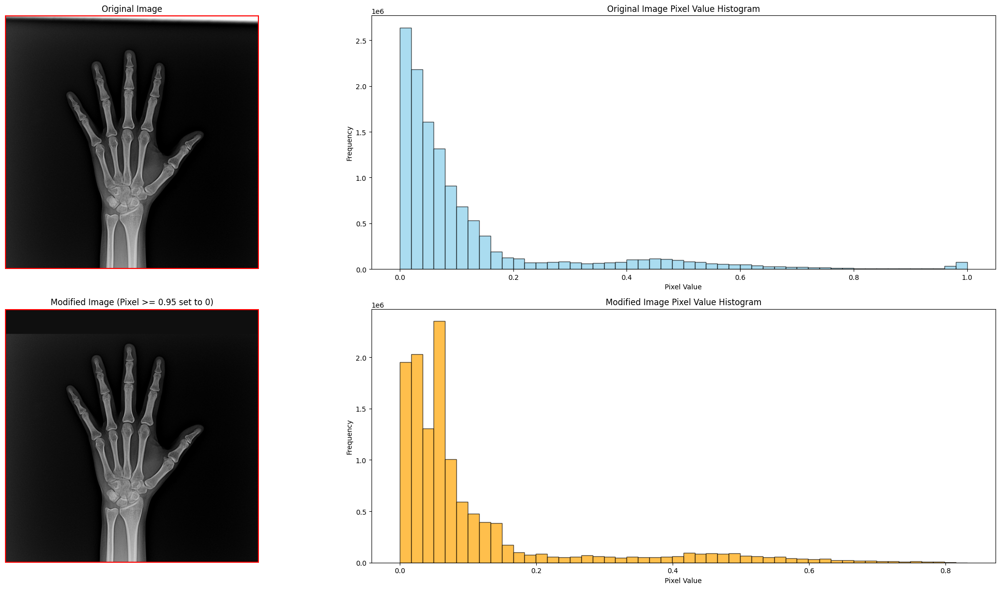

In [139]:
import matplotlib.patches as patches

# 이미지와 레이블 불러오기
image, label = dataset[11]

# 원본 이미지를 저장하여 나중에 비교할 수 있도록 함
original_image = image.clone()

# 이미지 수정: 픽셀 값 중 0.95 이상인 값들을 0으로 설정
image[:, :200, :] = 0.06  # 픽셀 값이 0.95 이상인 값을 0으로 설정

# 이미지 시각화 (RGB 이미지)
plt.figure(figsize=(24, 12))  # 더 넓은 화면으로 크기를 조정

# 원본 이미지 출력 (채널 순서를 맞추기 위해 permute 사용)
ax = plt.subplot(2, 2, 1)
rect = patches.Rectangle((0, 0), image.shape[2], image.shape[1], linewidth=3, edgecolor='red', facecolor='none')
ax.add_patch(rect)
plt.imshow(original_image.permute(1, 2, 0))  # (3, 2048, 2048) -> (2048, 2048, 3) 형태로 변환
plt.title('Original Image')
plt.axis('off')

# 수정된 이미지 출력 (채널 순서를 맞추기 위해 permute 사용)
ax = plt.subplot(2, 2, 3)
rect = patches.Rectangle((0, 0), image.shape[2], image.shape[1], linewidth=3, edgecolor='red', facecolor='none')
ax.add_patch(rect)
plt.imshow(image.permute(1, 2, 0))  # (3, 2048, 2048) -> (2048, 2048, 3) 형태로 변환
plt.title('Modified Image (Pixel >= 0.95 set to 0)')
plt.axis('off')

# 원본 이미지 히스토그램 출력
ax = plt.subplot(2, 2, 2)
plt.hist(original_image.flatten(), bins=50, color='skyblue', edgecolor='black', alpha=0.7)
plt.title('Original Image Pixel Value Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

# 수정된 이미지 히스토그램 출력
ax = plt.subplot(2, 2, 4)
plt.hist(image.flatten(), bins=50, color='orange', edgecolor='black', alpha=0.7)
plt.title('Modified Image Pixel Value Histogram')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


이미지 중 제일 위에 존재하는 pixel값의 위치를 알아내서 + 30 이상을 모두 검은색으로 칠하고 학습하면 성능이 올라갈까?

In [ ]:
# 제일 위에 있는 손가락보다 30픽셀 위가 어느 정도인지 확인
# 제일 하얀 이미지는 어느 정도인지 확인

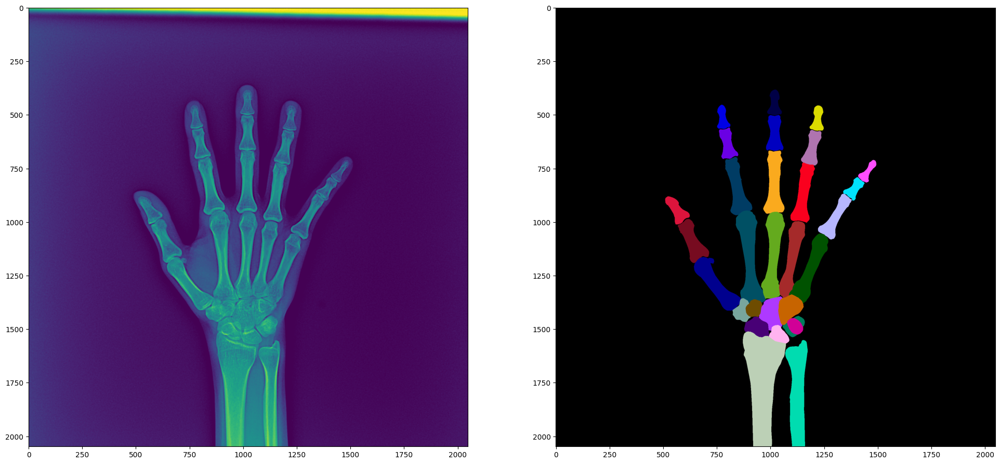

In [73]:
image, label = train_dataset[4]

fig, ax = plt.subplots(1, 2, figsize=(24, 12))
ax[0].imshow(image[0])    # color map 적용을 위해 channel 차원을 생략합니다.
ax[1].imshow(label2rgb(label))

plt.show()

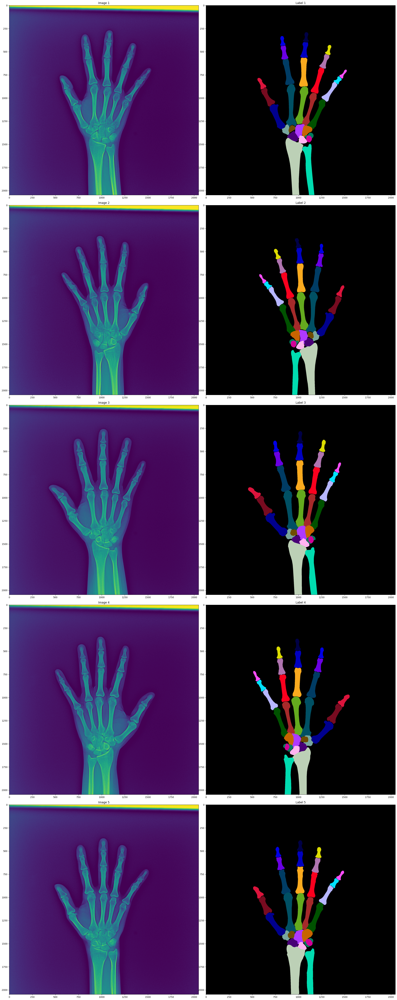

In [67]:
# 샘플 이미지 수 (예: 5개 이미지 확인)
num_samples = 5

# 여러 이미지와 레이블을 가져옵니다.
fig, ax = plt.subplots(num_samples, 2, figsize=(24, 12 * num_samples))

# 각 이미지와 레이블을 출력
for i in range(num_samples):
    image, label = train_dataset[i]
    ax[i, 0].imshow(image[0])
    ax[i, 0].set_title(f"Image {i+1}")
    ax[i, 1].imshow(label2rgb(label)) 
    ax[i, 1].set_title(f"Label {i+1}")

plt.tight_layout()
plt.show()